In [1]:
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Plot the data and the fitted line
rc = {'axes.facecolor':'white',
      'axes.grid' : True,
      'axes.edgecolor' : '0.1',
      'font.family':'Times New Roman',
      'axes.linewidth' :1, 'font.size': 20} # common parameters can be defined #here
plt.rcParams.update(rc)

In [3]:
da = pd.read_csv("monthly case 1.csv")

# Copy the original data to avoid modifying it
da_copy = da.copy()

# Remove rows that meet specific conditions
new_data = da_copy[~((da_copy['Econ PRMS Resources Class'] == 'contingent') & (da_copy['Econ PRMS Reserves Category'] == 'c3'))]


da2 = pd.read_csv("monthly case 2.csv")

# Copy the original data to avoid modifying it
da_copy2 = da2.copy()

# Remove rows that meet specific conditions
new_data2 = da_copy2[~((da_copy2['Econ PRMS Resources Class'] == 'contingent') & (da_copy2['Econ PRMS Reserves Category'] == 'c3'))]

In [4]:
# Calculate the PV 12% for case 1 and case 2

def calculate_discounted_cf_and_npv(group):
    # Assign n values starting from 1 for each row
    group['n'] = range(1, len(group) + 1)
    # Calculate discounted cash flow
    group['Discounted Cash Flow (M$)'] = group['Before Income Tax Cash Flow (M$)'] / ((1 + 0.12 / 12) ** group['n'])
    # Calculate NPV12 for the group (sum of discounted cash flows for all periods)
    group['NPV12 (M$)'] = group['Discounted Cash Flow (M$)'].sum()
    return group

PV_12_Case1 = new_data.groupby('Index').apply(calculate_discounted_cf_and_npv)
PV_12_Case2 = new_data2.groupby('Index').apply(calculate_discounted_cf_and_npv)


PV12_Case1 = PV_12_Case1.groupby('Index')['NPV12 (M$)'].first().reset_index()
PV12_Case2 = PV_12_Case2.groupby('Index')['NPV12 (M$)'].first().reset_index()

# Summing up the 'NPV12 (M$)' column in npv_summary_Case1
total_PV12_case1 = PV12_Case1['NPV12 (M$)'].sum()
formatted_total_PV12_case1 = f"${total_PV12_case1:.5f} (M$)"

print(f"The PV 12% for Case 1 is: {formatted_total_PV12_case1}")

# Summing up the 'NPV12 (M$)' column in npv_summary_Case2 with formatting
total_PV12_case2 = PV12_Case2['NPV12 (M$)'].sum()
formatted_total_PV12_case2 = f"${total_PV12_case2:.5f} (M$)"

print(f"The PV 12% for Case 2 is: {formatted_total_PV12_case2}")

The PV 12% for Case 1 is: $7361.15635 (M$)
The PV 12% for Case 2 is: $9434.85093 (M$)


In [5]:
# Investigate the effect of EUR on PV (or NPV); first fix the well number 

# Step 1: Extract the values of the API 14 column for each DataFrame
api14_1 = set(new_data['API 14'])
api14_2 = set(new_data2['API 14'])

# Step 2: Find the differences between the two sets of values
# Difference values are those that exist in only one set
diff_api14_1 = api14_1.difference(api14_2)  # API 14 values in new_data but not in new_data2
diff_api14_2 = api14_2.difference(api14_1)  # API 14 values in new_data2 but not in new_data

# Merge both sets of differences to get all unique API 14 values
all_diff_api14 = diff_api14_1.union(diff_api14_2)

# Step 3: Count and output the number of unique API 14 values not shared between the two datasets
diff_count = len(all_diff_api14)
print(f"Number of unique 'API 14' values not shared between the two cases: {diff_count}")

# Remove rows corresponding to differing API 14 values in new_data
new_data_updated = new_data[~new_data['API 14'].isin(all_diff_api14)]

# Remove rows corresponding to differing API 14 values in new_data2
new_data2_updated = new_data2[~new_data2['API 14'].isin(all_diff_api14)]

# Now, new_data_updated and new_data2_updated are the datasets with differing API 14 values removed

diff_api14_1_count = len(diff_api14_1)
print("Number of different wells in Case 1:", diff_api14_1_count)
diff_api14_2_count = len(diff_api14_2)
print("Number of different wells in Case 2:", diff_api14_2_count)

Number of unique 'API 14' values not shared between the two cases: 198
Number of different wells in Case 1: 138
Number of different wells in Case 2: 60


In [6]:
new_data_updated.shape

(642269, 78)

In [7]:
new_data2_updated.shape

(571613, 78)

In [8]:
# Calculate the number of shared API 14 values between the two datasets
shared_api14_count = len(set(new_data['API 14']).intersection(set(new_data2['API 14'])))
print("Number of total same wells in two cases:", shared_api14_count)


Number of total same wells in two cases: 1971


In [9]:
# Calculate the PV 12 for case 1 and case 2 with the same number of wells

# Define the monthly discount rate
monthly_discount_rate = 1 + 0.12 / 12

def calculate_discounted_cf_and_npv(group):
    # Assign an 'n' value starting from 1 to each row
    group['n'] = range(1, len(group) + 1)
    # Calculate the discounted cash flow
    group['Discounted Cash Flow (M$)'] = group['Before Income Tax Cash Flow (M$)'] / monthly_discount_rate ** group['n']
    # Calculate the NPV12 for the group (sum of discounted cash flows for all periods)
    group['NPV12 (M$)'] = group['Discounted Cash Flow (M$)'].sum()
    return group


discounted_cash_flow_with_npv_Case1 = new_data_updated.groupby('API 14').apply(calculate_discounted_cf_and_npv)
discounted_cash_flow_with_npv_Case2 = new_data2_updated.groupby('API 14').apply(calculate_discounted_cf_and_npv)

npv_summary_Case1 = discounted_cash_flow_with_npv_Case1.groupby('Index')['NPV12 (M$)'].first().reset_index()
npv_summary_Case2 = discounted_cash_flow_with_npv_Case2.groupby('Index')['NPV12 (M$)'].first().reset_index()

# Summing up the 'NPV12 (M$)' column in npv_summary_Case1
total_npv_case1 = npv_summary_Case1['NPV12 (M$)'].sum()
formatted_total_npv_case1 = f"${total_npv_case1:.5f} (M$)"

print(f"The NPV 12% for Case 1 is: {formatted_total_npv_case1}")

# Summing up the 'NPV12 (M$)' column in npv_summary_Case2 with formatting
total_npv_case2 = npv_summary_Case2['NPV12 (M$)'].sum()
formatted_total_npv_case2 = f"${total_npv_case2:.5f} (M$)"

print(f"The NPV 12% for Case 2 is: {formatted_total_npv_case2}")

The NPV 12% for Case 1 is: $6886.52014 (M$)
The NPV 12% for Case 2 is: $8757.38562 (M$)


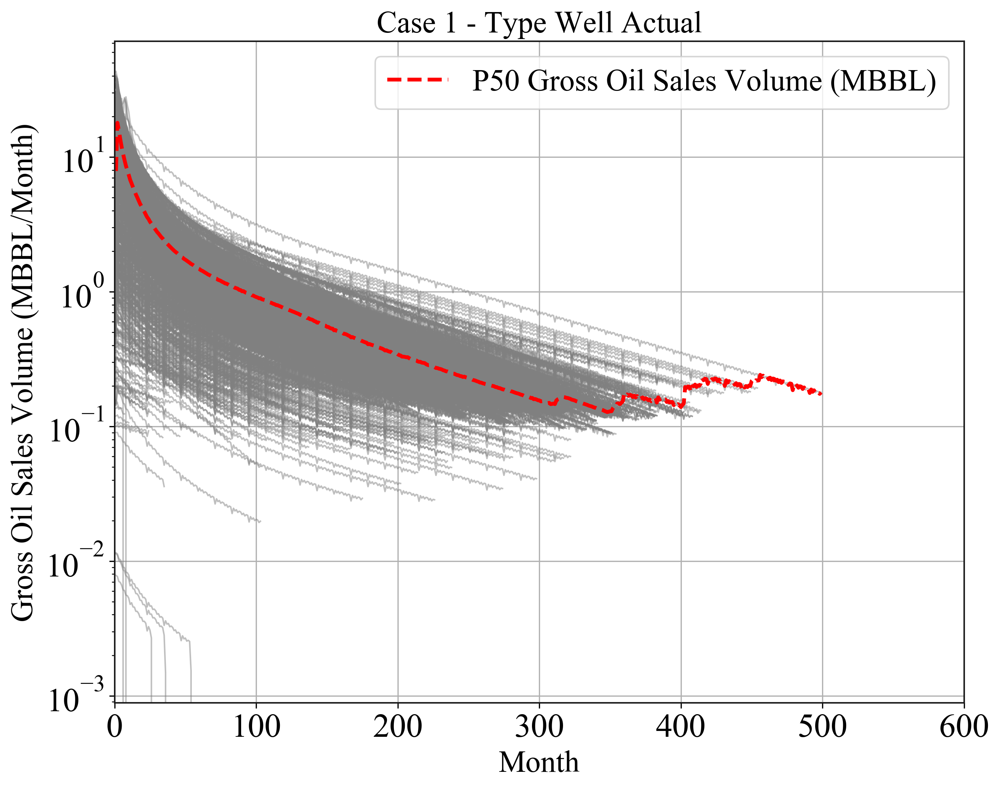

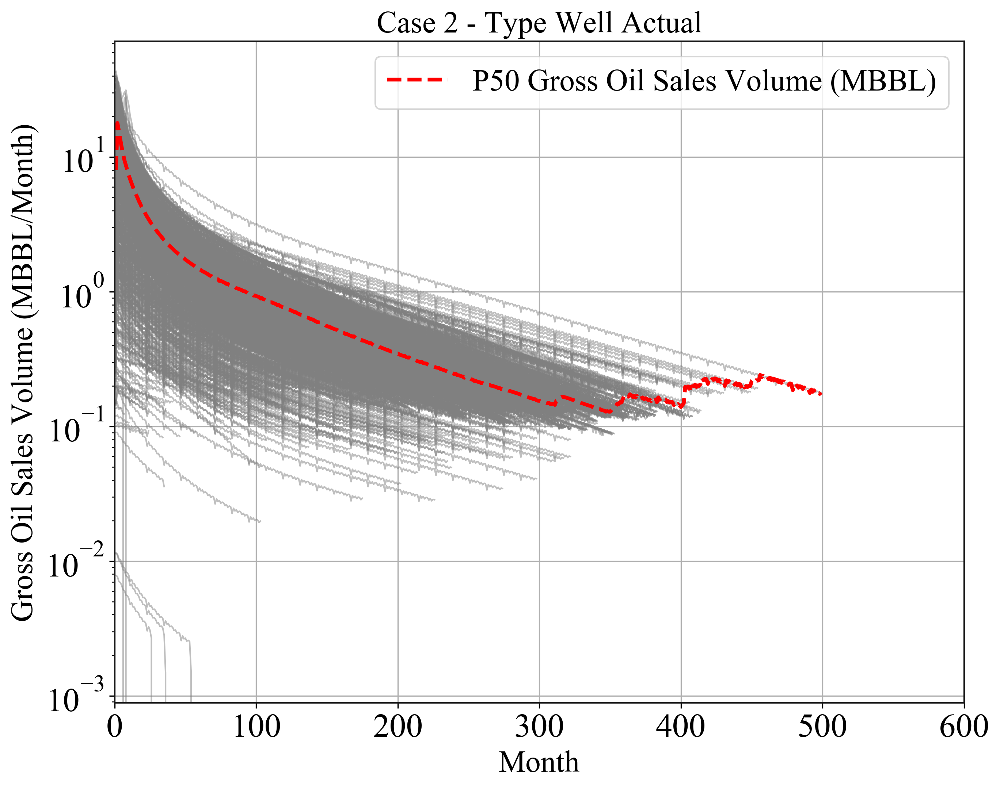

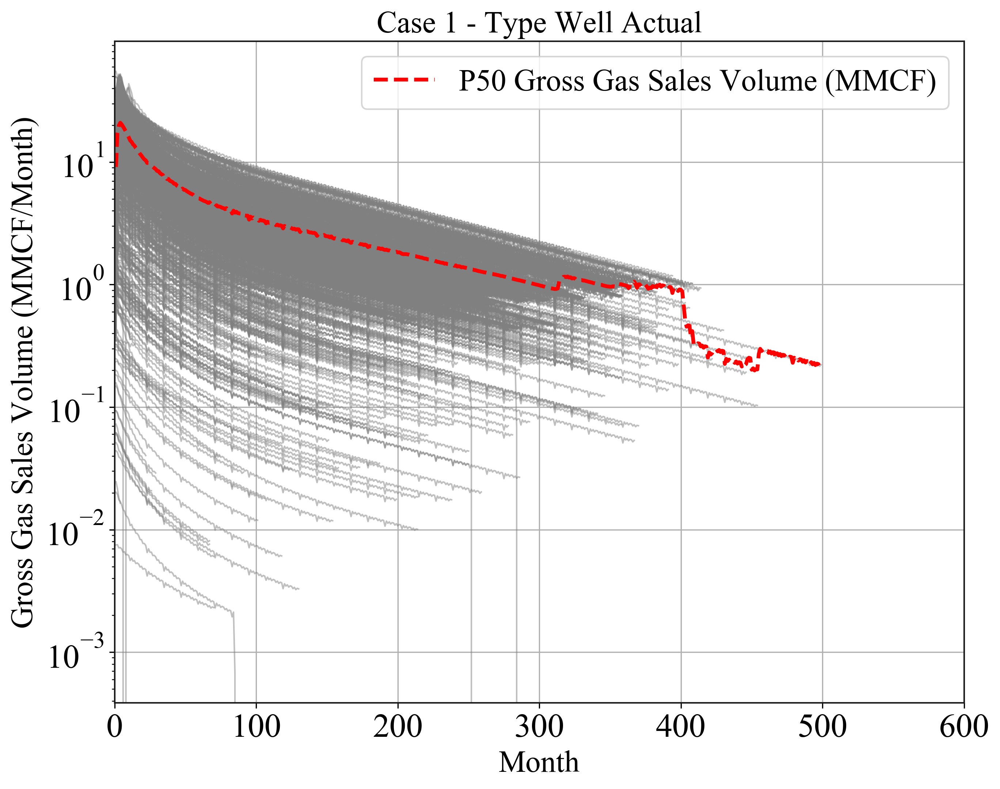

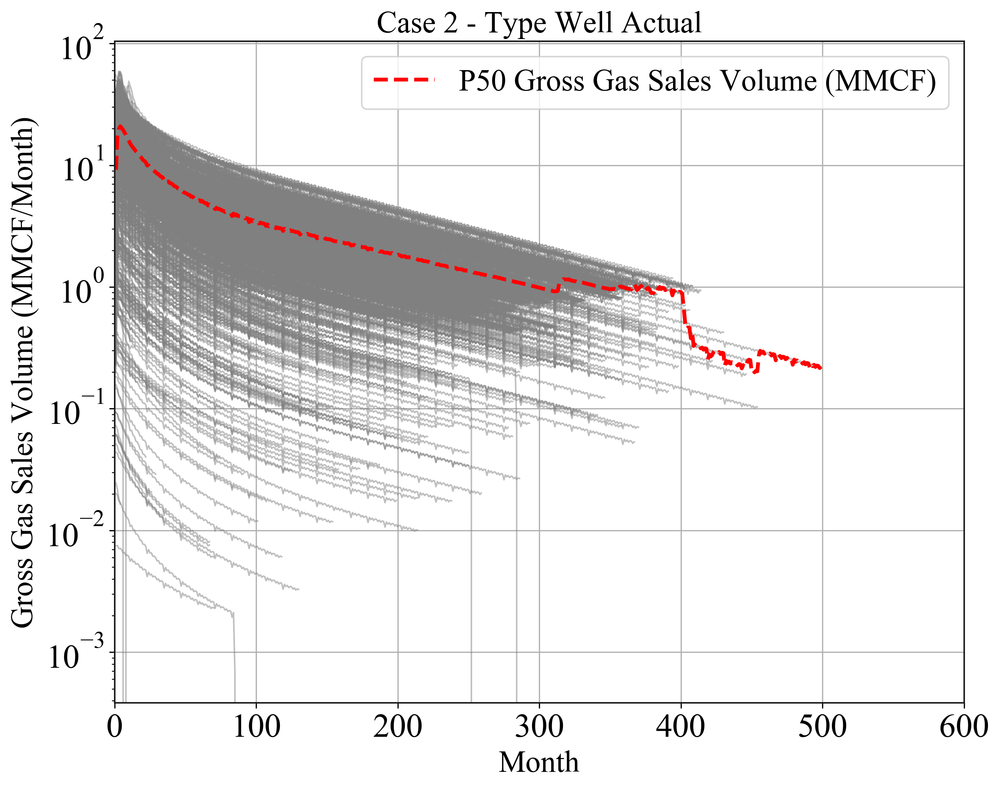

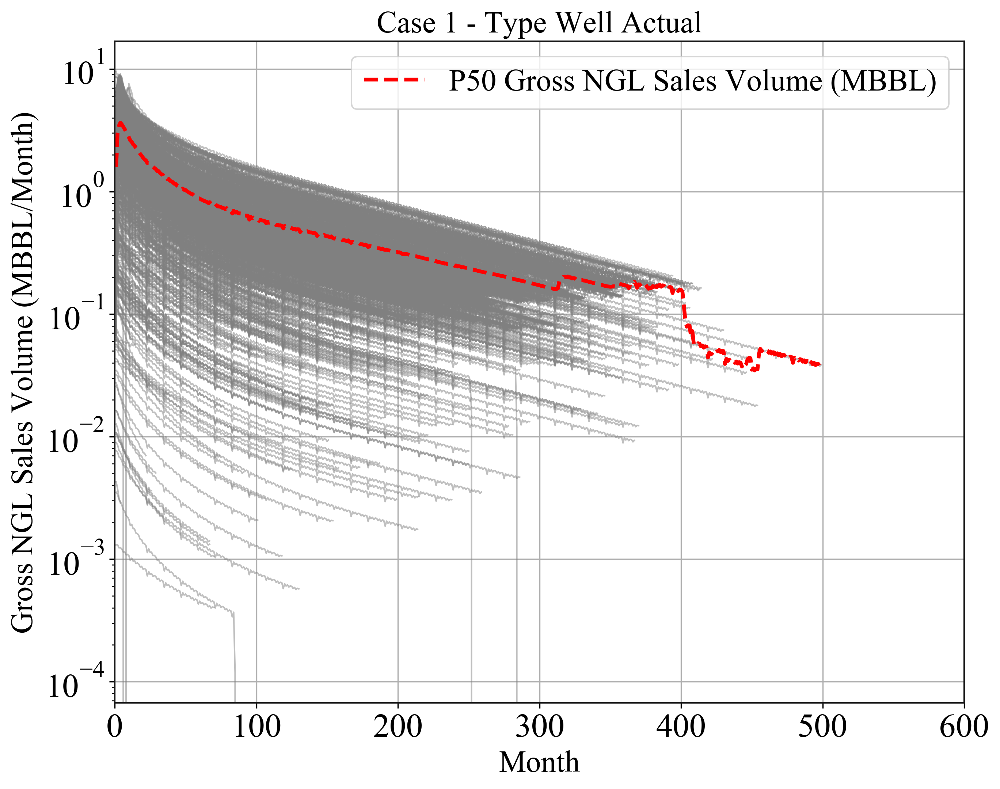

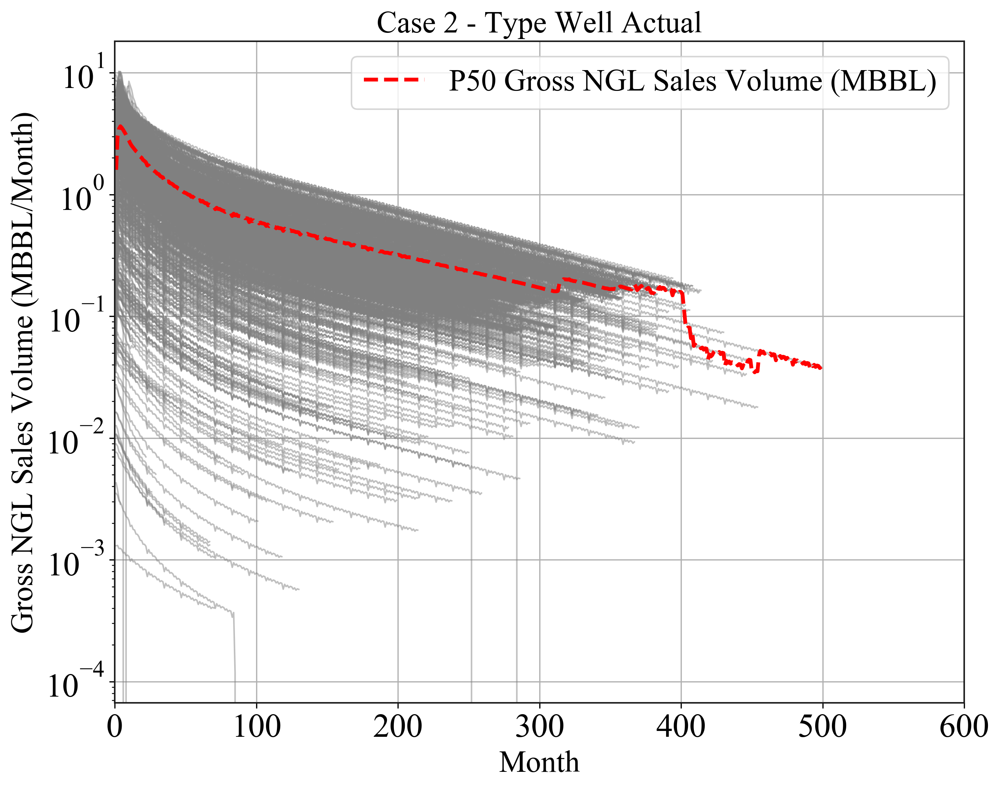

In [10]:
# Type curve analysis for two cases to investigate the EUR

eur_summary = {}
def process_group_for_p50(group, sales_type):
    start_row = group[(group['Gross Oil Sales Volume (MBBL)'] != 0) | 
                      (group['Gross Gas Sales Volume (MMCF)'] != 0) | 
                      (group['Gross NGL Sales Volume (MBBL)'] != 0)].index.min()
    if pd.isna(start_row):
        return None
    group = group.loc[start_row:]
    group['Time (Month)'] = range(1, len(group) + 1)
    return group[['Time (Month)', sales_type]]

def create_plot(dataset, dataset_name, sales_type, color, linestyle):
    all_groups_data = pd.DataFrame()

    for _, group in dataset.groupby('API 14'):
        processed_group = process_group_for_p50(group, sales_type)
        if processed_group is not None:
            all_groups_data = pd.concat([all_groups_data, processed_group])

    # Calculate the median for each time point
    p50_data = all_groups_data.groupby('Time (Month)').median().reset_index()
    unit = sales_type[sales_type.find("(")+1:sales_type.find(")")]
    
     # Construct a new Y-axis label
    y_label = f'{sales_type[:sales_type.find(" (")]} ({unit}/Month)'

    # Plot the data lines for all groups (specified color)
    plt.figure(figsize=(10, 8),dpi=300)
    for _, group in dataset.groupby('API 14'):
        processed_group = process_group_for_p50(group, sales_type)
        if processed_group is not None:
            plt.plot(processed_group['Time (Month)'], processed_group[sales_type], color=color, linewidth=1, alpha=0.5)

     # Plot the P50 line
    plt.plot(p50_data['Time (Month)'], p50_data[sales_type], linestyle, linewidth=2.5, label=f'P50 {sales_type}')
    #plt.ylabel(f'{sales_type} / Month', fontsize=20)
    plt.ylabel(y_label, fontsize=20)
    plt.xlabel("Month", fontsize=20)  # Set x-axis label as "Month"
    plt.xlim(0, 600)
    plt.tick_params(labelsize=22)  
    plt.yscale('log')
    plt.title(dataset_name, fontsize=20)  # Title changed to dataset_name
    plt.legend()
    # Save the plot
    plt.savefig(f"{dataset_name}_{sales_type.replace(' ', '_').replace('(', '').replace(')', '')}.png",bbox_inches='tight',pad_inches = 0.01)
    plt.show()
    
    # Calculate the total sum of Y values in P50 data as EUR
    eur = p50_data[sales_type].sum()
    #print(f"The EUR for {sales_type} in {dataset_name} is: {eur:.5f}")
    eur_summary[f"{sales_type} - {dataset_name}"] = eur
    
    # Save the P50 data to CSV file
#     csv_filename = f"{dataset_name}_{sales_type.replace(' ', '_').replace('(', '').replace(')', '')}_P50.csv"
#     p50_data.to_csv(csv_filename, index=False)
#     print(f"Saved P50 data to {csv_filename}")

# Call the create_plot function for each type
sales_types = {
    'Gross Oil Sales Volume (MBBL)': ('gray', 'r--'),
    'Gross Gas Sales Volume (MMCF)': ('gray', 'r--'),
    'Gross NGL Sales Volume (MBBL)': ('gray', 'r--')
}

for sales_type, (color, linestyle) in sales_types.items():
    create_plot(new_data_updated, "Case 1 - Type Well Actual", sales_type, color, linestyle)
    create_plot(new_data2_updated, "Case 2 - Type Well Actual", sales_type, color, linestyle)

In [11]:
# Print EUR
print("EUR Summary:")
for key, value in eur_summary.items():
    print(f"{key}: {value:.5f}")

EUR Summary:
Gross Oil Sales Volume (MBBL) - Case 1 - Type Well Actual: 417.40860
Gross Oil Sales Volume (MBBL) - Case 2 - Type Well Actual: 418.58881
Gross Gas Sales Volume (MMCF) - Case 1 - Type Well Actual: 1272.21102
Gross Gas Sales Volume (MMCF) - Case 2 - Type Well Actual: 1276.36364
Gross NGL Sales Volume (MBBL) - Case 1 - Type Well Actual: 221.25409
Gross NGL Sales Volume (MBBL) - Case 2 - Type Well Actual: 221.97629


In [12]:
# Investigate the effect of well timing: time to initial production

def count_zeros_in_group(group, column_names):
    zeros_count = {column: (group[column] == 0).sum() for column in column_names}
    return zeros_count

# Check the column names
sales_volume_columns = ['Gross Oil Sales Volume (MBBL)', 'Gross Gas Sales Volume (MMCF)', 'Gross NGL Sales Volume (MBBL)']

# Group and count zeros in the new_data_updated dataset
grouped = new_data_updated.groupby('API 14')
zeros_count_case1 = {name: count_zeros_in_group(group, sales_volume_columns) for name, group in grouped}

# Group and count zeros in the new_data2_updated dataset
grouped2 = new_data2_updated.groupby('API 14')
zeros_count_case2 = {name: count_zeros_in_group(group, sales_volume_columns) for name, group in grouped2}

# Calculate the total number of zeros for each case
zeros_total_case1 = sum(sum(counts.values()) for counts in zeros_count_case1.values())
zeros_total_case2 = sum(sum(counts.values()) for counts in zeros_count_case2.values())

print(f"Total number of months with delayed producing in Case 1: {zeros_total_case1}")
print(f"Total number of months with delayed producing in Case 2: {zeros_total_case2}")

Total number of months with delayed producing in Case 1: 489968
Total number of months with delayed producing in Case 2: 274658


In [13]:
# Calculate relative impact of well timing
relative_impact_zeros = (zeros_total_case1 - zeros_total_case2) / zeros_total_case1 * 100

# Remove non-numeric characters from the string and convert to float
formatted_total_npv_case1_cleaned = formatted_total_npv_case1.replace('$', '').replace('(M$)', '').replace('(M)', '').strip()
formatted_total_npv_case2_cleaned = formatted_total_npv_case2.replace('$', '').replace('(M$)', '').replace('(M)', '').strip()

# Convert the cleaned string to float
formatted_total_npv_case1_numeric = float(formatted_total_npv_case1_cleaned)
formatted_total_npv_case2_numeric = float(formatted_total_npv_case2_cleaned)

# Calculate relative impact of NPV
relative_impact_npv = (formatted_total_npv_case2_numeric - formatted_total_npv_case1_numeric) / formatted_total_npv_case1_numeric * 100

print(f"Relative change of well timing: {relative_impact_zeros:.2f}%")
print(f"Relative change of NPV: {relative_impact_npv:.2f}%")


Relative change of well timing: 43.94%
Relative change of NPV: 27.17%


In [14]:
# Investigate the gross/net well count
# For case 1

NRI_oil_sum_case1 = new_data_updated['NRI Oil (%)'].sum() /100
gross_net_well_count_case1 = shared_api14_count / NRI_oil_sum_case1

# For case 2
NRI_oil_sum_case2 = new_data2_updated['NRI Oil (%)'].sum() /100
gross_net_well_count_case2 = shared_api14_count / NRI_oil_sum_case2

print(f"Case 1: Gross/Net Well Count: {gross_net_well_count_case1}")
print(f"Case 2: Gross/Net Well Count: {gross_net_well_count_case2}")

relative_impact_grossnetwell = (gross_net_well_count_case2 - gross_net_well_count_case1) / gross_net_well_count_case2 * 100
print(f"Relative change of Gross/net well count: {relative_impact_grossnetwell:.2f}%")

Case 1: Gross/Net Well Count: 6.157791044078809
Case 2: Gross/Net Well Count: 6.930752806252997
Relative change of Gross/net well count: 11.15%


In [15]:
# Creat a new dataframe to same NPV12
npv_summary = discounted_cash_flow_with_npv_Case1.groupby('Index')['NPV12 (M$)'].first().reset_index()
npv_summary.to_csv("NPV_summary_by_indexCase1.csv", index=False)

npv_summary2 = discounted_cash_flow_with_npv_Case2.groupby('Index')['NPV12 (M$)'].first().reset_index()
npv_summary2.to_csv("NPV_summary_by_indexCase2.csv", index=False)

In [16]:
# For case 1
npv_summary = discounted_cash_flow_with_npv_Case1.groupby('Index').agg({
    'NPV12 (M$)': 'first',
    'API 14': 'first',
    'Chosen ID':'first',
    'Well Name': 'first',
    'Current Operator Alias':'first',
    'Type Curve Area': 'first'
}).reset_index()

# Save npv_summary to a CSV file
npv_summary.to_csv("NPV_summary_by_indexCase1.csv", index=False)

# For case 2
npv_summary2 = discounted_cash_flow_with_npv_Case2.groupby('Index').agg({
    'NPV12 (M$)': 'first',
    'API 14': 'first',
    'Chosen ID':'first',
    'Well Name': 'first',
    'Current Operator Alias':'first',
    'Type Curve Area': 'first'
}).reset_index()

npv_summary2.to_csv("NPV_summary_by_indexCase2.csv", index=False)

In [17]:
# Read the file containing additional information
file_path = 'oneline case 1.csv'
df_additional = pd.read_csv(file_path)

file_path2 = 'oneline case 2.csv'
df_additional2 = pd.read_csv(file_path2)


# Extract additional information and ensure only one representative value per Index
additional_info_columns = df_additional.groupby('Index').agg({
    'Landing Zone': 'first',
    'Current RSV CAT': 'first',
    'Basin': 'first',
    'Lateral Length (FT)': 'first',
    'Perf Lateral Length (FT)': 'first',
    'Hole Direction': 'first'
}).reset_index()


additional_info_columns2 = df_additional2.groupby('Index').agg({
    'Landing Zone': 'first',
    'Current RSV CAT': 'first',
    'Basin': 'first',
    'Lateral Length (FT)': 'first',
    'Perf Lateral Length (FT)': 'first',
    'Hole Direction': 'first'
}).reset_index()


npv_summary_with_additional_info = pd.merge(npv_summary, additional_info_columns, on='Index', how='inner')
npv_summary_with_additional_info.to_csv("NPV_summary_with_additional_info_Case1.csv", index=False)


npv_summary2_with_additional_info = pd.merge(npv_summary2, additional_info_columns2, on='Index', how='inner')
npv_summary2_with_additional_info.to_csv("NPV_summary_with_additional_info_Case2.csv", index=False)


In [18]:
# Add Units into the dataset
npv_data = pd.read_csv("NPV_summary_with_additional_info_Case1.csv")
npv_data2 = pd.read_csv("NPV_summary_with_additional_info_Case2.csv")

units_data = pd.read_excel("Development Units.xlsx")
units_mapping = units_data.set_index('Well Chosen ID')['Development Units'].to_dict()


npv_data['Development Units'] = npv_data['Chosen ID'].map(units_mapping)
npv_data.to_csv("NPV_summary_with_additional_info_Case1_updated.csv", index=False)

npv_data2['Development Units'] = npv_data2['Chosen ID'].map(units_mapping)
npv_data2.to_csv("NPV_summary_with_additional_info_Case2_updated.csv", index=False)

In [19]:
# case 1: Statistical analysis for the specific units, RSV CATs, landing zones, type curve areas, etc
file = 'NPV_summary_with_additional_info_Case1_updated.csv'
data = pd.read_csv(file)

npv_descriptive_stats = data['NPV12 (M$)'].describe()
print("Descriptive Statistics for NPV12 (M$):")
print(npv_descriptive_stats)

categorical_variables = ['Current RSV CAT', 'Landing Zone', 'Type Curve Area', 'Current Operator Alias', 'Basin', 'Hole Direction']

plt.figure(figsize=(20, 28),dpi=500)

for i, variable in enumerate(categorical_variables, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(x=variable, y='NPV12 (M$)', data=data)
    plt.xticks(rotation=45)
    plt.title(f'Impact of {variable} on NPV12 (M$) in Case 1', fontsize=20)
    plt.xlabel(variable, fontsize=20)
    plt.ylabel('NPV12 (M$)', fontsize=20)

    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()


Descriptive Statistics for NPV12 (M$):
count    1971.000000
mean        3.493922
std         4.329671
min         0.000000
25%         0.506886
50%         1.856565
75%         4.983120
max        30.636789
Name: NPV12 (M$), dtype: float64


In [20]:
# case 2: Statistical analysis for the specific units, RSV CATs, landing zones, type curve areas, etc

file2 = 'NPV_summary_with_additional_info_Case2_updated.csv'
data2 = pd.read_csv(file2)

npv_descriptive_stats2 = data2['NPV12 (M$)'].describe()
print("Descriptive Statistics for NPV12 (M$) in Case 2:")
print(npv_descriptive_stats2)


categorical_variables = ['Current RSV CAT', 'Landing Zone', 'Type Curve Area', 'Current Operator Alias', 'Basin', 'Hole Direction']

plt.figure(figsize=(20, 28),dpi=500)

for i, variable in enumerate(categorical_variables, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(x=variable, y='NPV12 (M$)', data=data2)
    plt.xticks(rotation=45)
    plt.title(f'Impact of {variable} on NPV12 (M$) in Case 2', fontsize=20)
    plt.xlabel(variable, fontsize=20)
    plt.ylabel('NPV12 (M$)', fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()


Descriptive Statistics for NPV12 (M$) in Case 2:
count    1971.000000
mean        4.443118
std         4.561429
min         0.000000
25%         0.838645
50%         3.221211
75%         6.546178
max        30.948558
Name: NPV12 (M$), dtype: float64


In [21]:
# Assuming 'data' is your loaded DataFrame
summarized_results = []

# Calculate the sum of NPV12 (M$) for each category in each categorical variable
for variable in categorical_variables:
    grouped_data = data.groupby(variable)['NPV12 (M$)'].sum().reset_index(name='NPV12 (M$)')
    grouped_data['Variable'] = variable  # Adding a new column to indicate the variable name
    summarized_results.append(grouped_data)

# Concatenate all the results into a single DataFrame
final_summary = pd.concat(summarized_results, ignore_index=True)


file2 = 'NPV_summary_with_additional_info_Case2_updated.csv'
data2 = pd.read_csv(file2)

# Initialize an empty list to store summarized data for each categorical variable
summarized_results_data2 = []

for variable in categorical_variables:
    # Group by the categorical variable and calculate the sum of NPV12 (M$)
    group_summary_data2 = data2.groupby(variable)['NPV12 (M$)'].sum().reset_index(name='NPV12 (M$)')
    group_summary_data2['Variable'] = variable  # Add a new column to mark the categorical variable
    summarized_results_data2.append(group_summary_data2)

# Concatenate all the summarized results into a single DataFrame
final_summary_2 = pd.concat(summarized_results_data2, ignore_index=True)



In [22]:
# Create a new DataFrame to store NPV differences between cases 1 and 2
npv_differences_df = pd.DataFrame()

# Iterate over each categorical variable
for variable in categorical_variables:
    
    temp_df = final_summary[final_summary['Variable'] == variable].copy()
    temp_df_2 = final_summary_2[final_summary_2['Variable'] == variable].copy()
    
   # Ensure the order of categories is the same in both DataFrames for correct subtraction
    temp_df = temp_df.set_index(variable)
    temp_df_2 = temp_df_2.set_index(variable)
    
    # # Calculate NPV differences at each well 
    temp_df['NPV_Difference'] = temp_df_2['NPV12 (M$)'] - temp_df['NPV12 (M$)']
    
    # 重置索引并保留差异结果
    temp_df = temp_df.reset_index()[[variable, 'NPV_Difference']]
    temp_df['Variable'] = variable  
    
    npv_differences_df = pd.concat([npv_differences_df, temp_df], ignore_index=True)

# Save the NPV difference data to a CSV file
npv_differences_df.to_csv('npv_differences.csv', index=False)


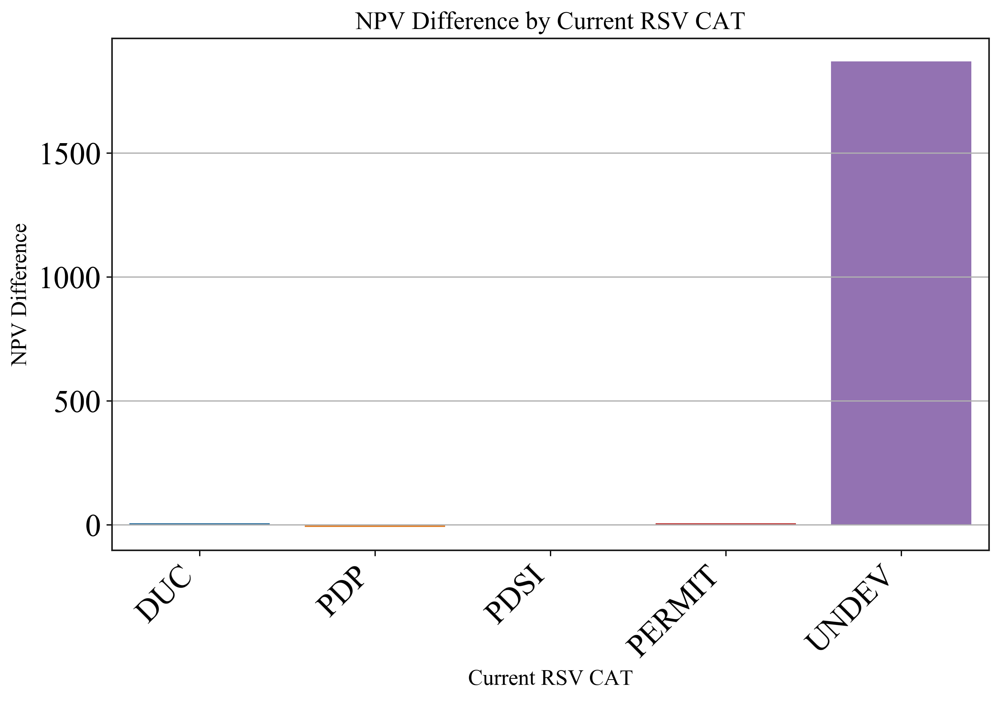

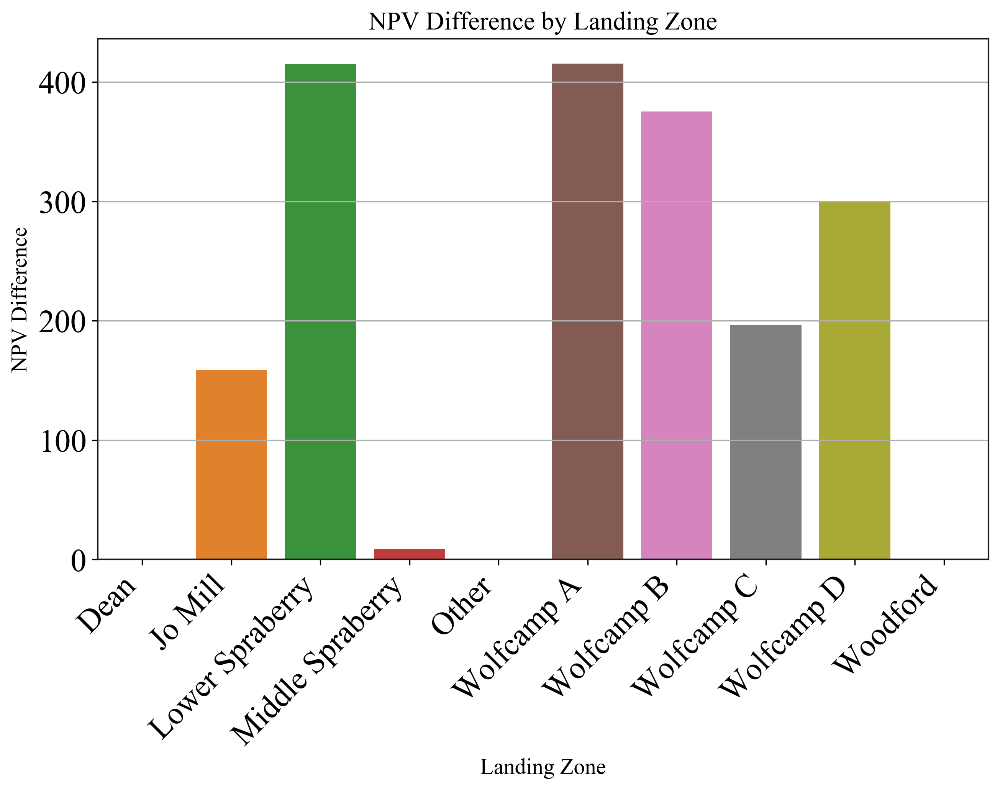

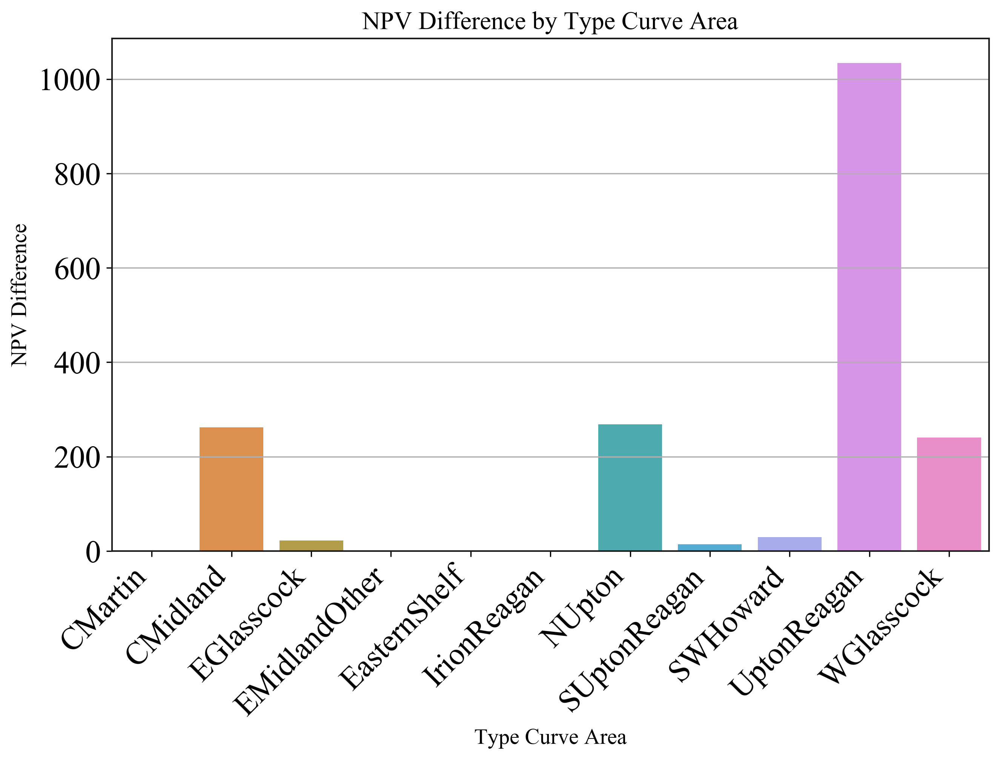

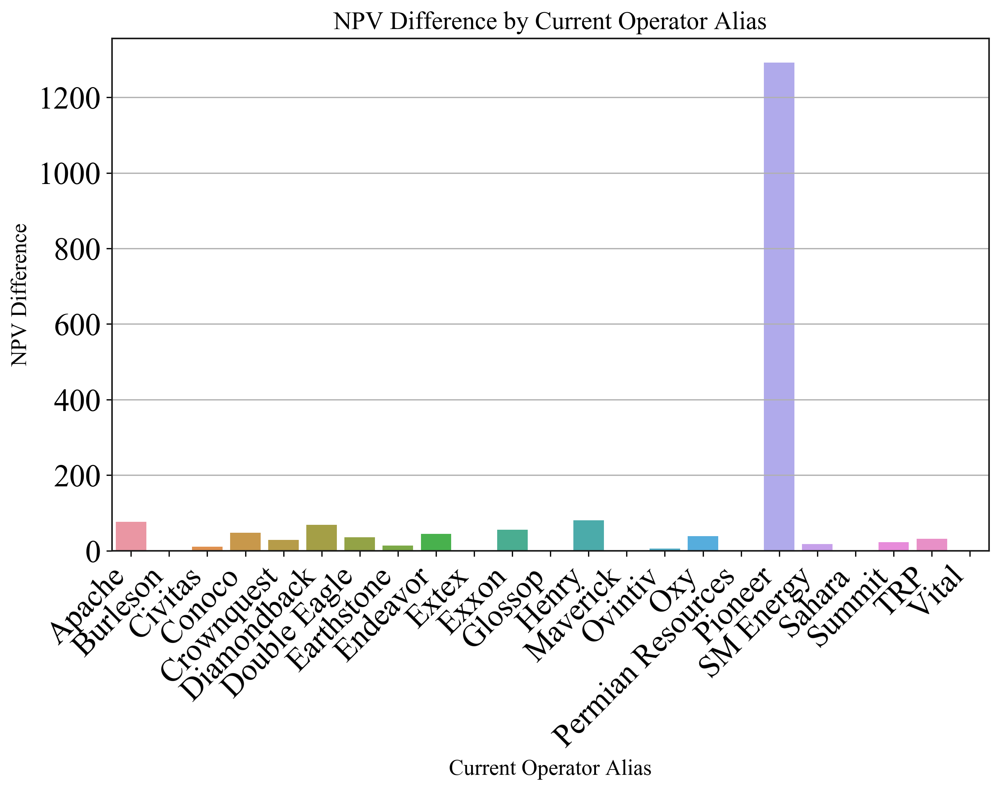

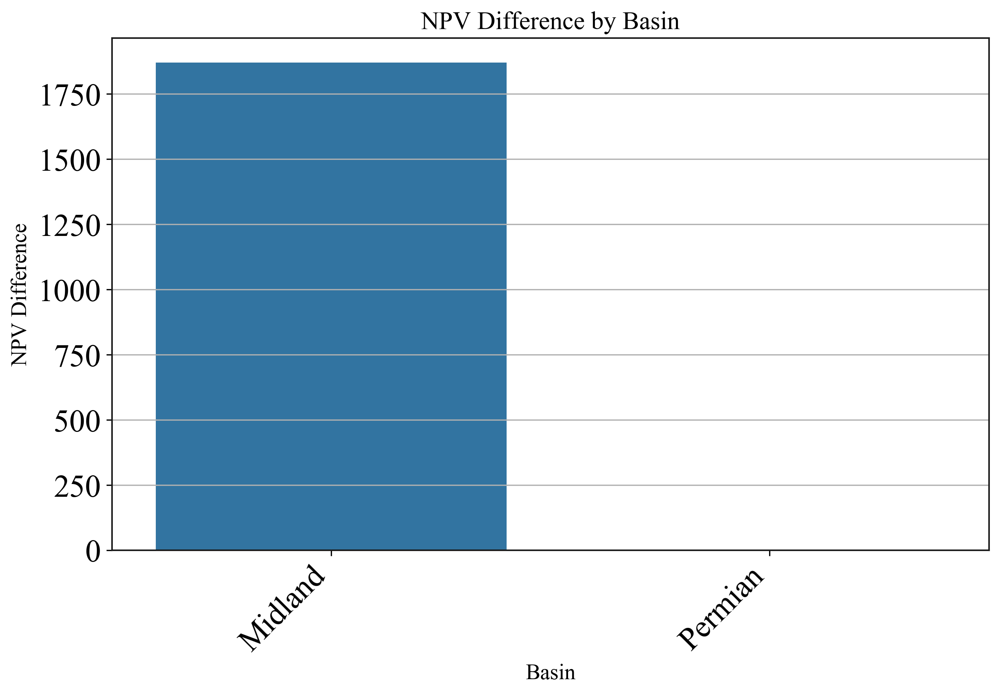

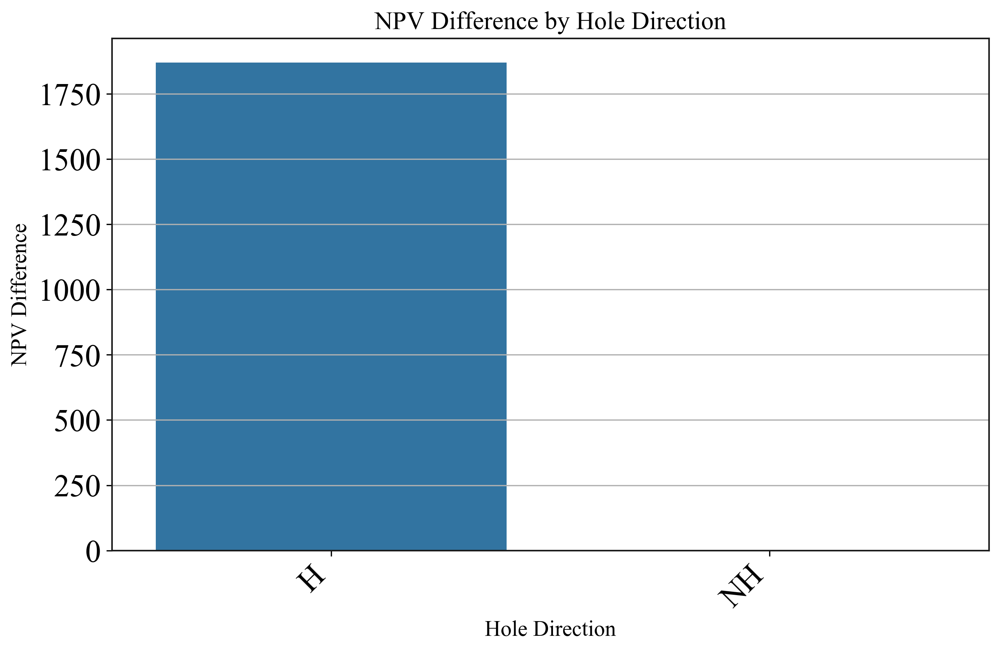

In [23]:
# Compare the difference between cases 1 and 2

for variable in categorical_variables:
    # Filter the DataFrame for the current variable
    plot_data = npv_differences_df[npv_differences_df['Variable'] == variable]

    # Create a bar plot with 'variable' categories on x-axis and 'NPV_Difference' on y-axis
    plt.figure(figsize=(10, 6), dpi=300)  # Set the figure size
    barplot = sns.barplot(x=variable, y='NPV_Difference', data=plot_data)
    
    # Set the title and labels of the plot
    barplot.set_title(f'NPV Difference by {variable}', fontsize=16)
    barplot.set_xlabel(variable, fontsize=14)
    barplot.set_ylabel('NPV Difference', fontsize=14)
    
    # Rotate x-axis labels for better readability if there are many categories
    plt.setp(barplot.get_xticklabels(), rotation=45, horizontalalignment='right')
     # Save the plot
    plt.savefig(f'NPV_Difference_{variable}.png', bbox_inches='tight')
    # Show the plot
    plt.show()


In [24]:
# Calculate the change in RSV CAT for a given well from undeveloped to permit 

# Read the additional information file
file_path = 'oneline case 1.csv'
df_additional = pd.read_csv(file_path)

# Read the additional information file for case 2
file_path2 = 'oneline case 2.csv'
df_additional2 = pd.read_csv(file_path2)

# Convert 'Permit Date' column to datetime for case 1
df_additional['Permit Date'] = pd.to_datetime(df_additional['Permit Date'], errors='coerce')

# Filter rows satisfying conditions and calculate the total undeveloped well count
filtered_data = df_additional[
    (df_additional['Econ PRMS Reserves Category'].isin(['c2', 'probable', 'proved'])) & 
    (df_additional['Econ PRMS Reserves Sub Category'] == 'undeveloped')
]
total_undeveloped_well = filtered_data.shape[0]
print("Total number of undeveloped wells in Case 1:", total_undeveloped_well)

# Remove rows with 'Permit Date' in the year 2022 and blank entries
cleaned_data = filtered_data[
    ~filtered_data['Permit Date'].dt.year.isin([2022, 2021, 2020]) & 
    filtered_data['Permit Date'].notna()
]

well_number = cleaned_data.shape[0]
print("Number of conversions from undeveloped to permit in Case 1:", well_number)

# Calculate the percentage of well number relative to total undeveloped well in Case 1
percentage = well_number / total_undeveloped_well if total_undeveloped_well > 0 else 0
print(f"Percentage of well number relative to total undeveloped well in Case 1: {percentage:.4f}")


# Repeat the process for case 2
df_additional2['Permit Date'] = pd.to_datetime(df_additional2['Permit Date'], errors='coerce')

filtered_data = df_additional2[
    (df_additional2['Econ PRMS Reserves Category'].isin(['c2', 'probable', 'proved'])) & 
    (df_additional2['Econ PRMS Reserves Sub Category'] == 'undeveloped')
]
total_undeveloped_well = filtered_data.shape[0]
print("Total number of undeveloped wells in Case 2:", total_undeveloped_well)

cleaned_data = filtered_data[
    ~(filtered_data['Permit Date'].dt.year == 2022) & 
    filtered_data['Permit Date'].notna()
]

well_number = cleaned_data.shape[0]
print("Number of conversions from undeveloped to permit in Case 2:", well_number)

percentage = well_number / total_undeveloped_well if total_undeveloped_well > 0 else 0
print(f"Percentage of well number relative to total undeveloped well in Case 2: {percentage:.4f}")


Total number of undeveloped wells in Case 1: 1378
Number of conversions from undeveloped to permit in Case 1: 22
Percentage of well number relative to total undeveloped well in Case 1: 0.0160
Total number of undeveloped wells in Case 2: 1276
Number of conversions from undeveloped to permit in Case 2: 58
Percentage of well number relative to total undeveloped well in Case 2: 0.0455


In [25]:
# Calculate the conversion from wells in progress (Permit, DUC, WOP) to PDP
# Case 1

# Step 1: Filter the data for 'proved' in Econ PRMS Reserves Category 
 #and either 'behind_pipe' or 'undeveloped' in Econ PRMS Reserves Sub Category
    
filtered_data = new_data[
    (new_data['Econ PRMS Reserves Category'] == 'proved') & 
    new_data['Econ PRMS Reserves Sub Category'].isin(['behind_pipe', 'undeveloped'])
]

# Step 2: Calculate the total number of wells in progress
total_in_progress_wells_number = filtered_data['Index'].nunique()

# Step 3: Filter for all 'Gross Oil Sales Volume (MBBL)' values being 0 for each Index
# Group by each Index and check if all 'Gross Oil Sales Volume (MBBL)' within the group are 0 or NaN
grouped = filtered_data.groupby('Index')
is_non_conversion = grouped['Gross Oil Sales Volume (MBBL)'].transform(lambda x: (x == 0).all() or x.isna().all())
non_conversion_data = filtered_data[is_non_conversion]
non_conversion_number = non_conversion_data['Index'].nunique()

# Step 4: Calculate the number of converted wells
converted_number = total_in_progress_wells_number - non_conversion_number


print(f"Total in progress wells number in case 1: {total_in_progress_wells_number}")
print(f"Non-conversion number in case 1: {non_conversion_number}")
print(f"Total conversion number of wells from in progress to PDP in case 1: {converted_number}")

percentage = converted_number / total_in_progress_wells_number if total_undeveloped_well > 0 else 0
print(f"Percentage of conversion  in Case 1: {percentage:.4f}")

Total in progress wells number in case 1: 72
Non-conversion number in case 1: 2
Total conversion number of wells from in progress to PDP in case 1: 70
Percentage of conversion  in Case 1: 0.9722


In [26]:
# Calculate the conversion from wells in progress (Permit, DUC, WOP) to PDP
# Case 1

filtered_data = df_additional2[
    (df_additional2['Econ PRMS Reserves Category'] == 'proved') & 
    df_additional2['Econ PRMS Reserves Sub Category'].isin(['behind_pipe', 'undeveloped'])
]


total_in_progress_wells_number = filtered_data['Index'].nunique()


filtered_data['Gross Oil Sales Volume (MBBL)'].fillna(0, inplace=True)
filtered_data['Gross Oil Sales Volume (MBBL)'] = pd.to_numeric(filtered_data['Gross Oil Sales Volume (MBBL)'], errors='coerce').fillna(0)
non_conversion_number = filtered_data[filtered_data['Gross Oil Sales Volume (MBBL)'] == 0]['Index'].nunique()

#（Total - non-conversion number）
converted_number = total_in_progress_wells_number - non_conversion_number

print(f"Total in progress wells number in case 2: {total_in_progress_wells_number}")
print(f"Non-conversion number in case 2: {non_conversion_number}")
print(f"Total conversion number of wells from in progress to PDP in case 2: {converted_number}")

percentage2 = converted_number / total_in_progress_wells_number if total_undeveloped_well > 0 else 0
print(f"Percentage of conversion  in Case 2: {percentage2:.4f}")

Total in progress wells number in case 2: 120
Non-conversion number in case 2: 2
Total conversion number of wells from in progress to PDP in case 2: 118
Percentage of conversion  in Case 2: 0.9833
